# EJERCICIO 

El conjunto de datos FEV
El FEV, que es un acrónimo de volumen espiratorio forzado, es una medida de la cantidad de aire que una persona
puede exhalar (en litros) durante una respiración forzada. En este conjunto de datos, se midió el FEV de 606 niños,
entre las edades de 6 y 17 años. El conjunto de datos también proporciona información adicional sobre estos niños:
su edad, su altura, su sexo y, lo que es más importante, si el niño es fumador o no fumador.

Con el conjunto de datos “FEV_data.csv” que se encuentra en la carpeta de datos de la documentación, y sabiendo que la variable objetivo es ‘fev’, se pide:
- Reporte descriptivo de los datos. Dimensiones del dataset, número de variables continuas,categóricas, Distribuciones, Regression Linear  y Comentarios generales.


In [45]:
import NuestrasFunciones_Def
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score


import numpy as np
import pandas as pd
pd.set_option("display.max_rows", None, "display.max_columns", None)


In [2]:
#1.1 Reporte descriptivo de los datos
#lectura de Datos
fevdata =  pd.read_csv("C:\\Users\\realf\\OneDrive\\Documents\\CLASES MASTER\\Mineria de Datos\\Tarea Guille Mineria de datos\\FEV_data.csv")
fevdata.head()

,seqnbr,subjid,age,fev,height,sex,smoke
0,1,301,9,1.708,57.0,2,2
1,2,451,8,1.724,67.5,2,2
2,3,501,7,1.720,54.5,2,2
3,4,642,9,1.558,53.0,1,2
4,5,901,9,1.895,57.0,1,2


In [3]:
#Informacion Dataset
fevdata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 654 entries, 0 to 653
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   seqnbr  654 non-null    int64  
 1   subjid  654 non-null    int64  
 2   age     654 non-null    int64  
 3   fev     654 non-null    float64
 4   height  654 non-null    float64
 5   sex     654 non-null    int64  
 6   smoke   654 non-null    int64  
dtypes: float64(2), int64(5)
memory usage: 35.9 KB


In [4]:
#Numero de valores distitos por  variable
fevdata.nunique()

seqnbr    654
subjid    654
age        17
fev       575
height     56
sex         2
smoke       2
dtype: int64

In [5]:
#Lista de Columnas con menos de 10 valores distintos. Potenciales factores
to_factor = list(fevdata.loc[:,fevdata.nunique() < 10])

#Cambiar a tipi Categorica
fevdata[to_factor] = fevdata[to_factor].astype('category')

In [6]:
#Numero de valores distitos por  variable
fevdata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 654 entries, 0 to 653
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype   
---  ------  --------------  -----   
 0   seqnbr  654 non-null    int64   
 1   subjid  654 non-null    int64   
 2   age     654 non-null    int64   
 3   fev     654 non-null    float64 
 4   height  654 non-null    float64 
 5   sex     654 non-null    category
 6   smoke   654 non-null    category
dtypes: category(2), float64(2), int64(3)
memory usage: 27.2 KB


In [7]:
#Numero de valores distitos por  variable
fevdata.describe()

,seqnbr,subjid,age,fev,height
count,654.00000,654.000000,654.000000,654.000000,654.000000
mean,327.50000,37169.571865,9.931193,2.636780,61.143578
std,188.93782,23690.860350,2.953935,0.867059,5.703513
min,1.00000,201.000000,3.000000,0.791000,46.000000
25%,164.25000,15811.000000,8.000000,1.981000,57.000000
50%,327.50000,36071.000000,10.000000,2.547500,61.500000
75%,490.75000,53638.500000,12.000000,3.118500,65.500000
max,654.00000,90001.000000,19.000000,5.793000,74.000000


In [9]:
#Numero de valores distitos por  variable
fevdata.describe(exclude=np.number)

,sex,smoke
count,654,654
unique,2,2
top,1,2
freq,336,589


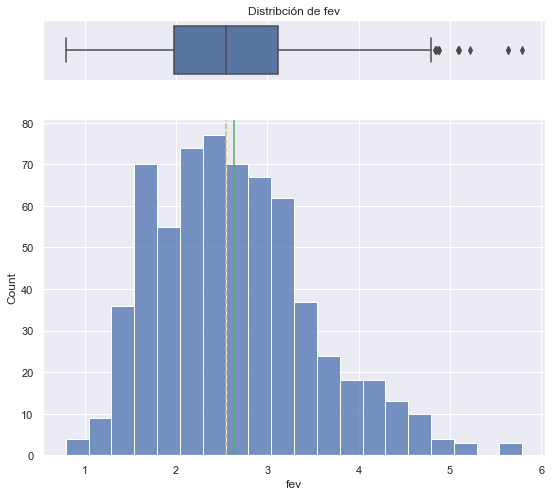

In [8]:
#Histograma con boxplot, revision de outliers

NuestrasFunciones_Def.histogram_boxplot(fevdata.fev, bins = 20, font_scale=1, title="Distribción de fev")

In [9]:
NuestrasFunciones_Def.cat_plot(fevdata.sex)

In [10]:
NuestrasFunciones_Def.cat_plot(fevdata.smoke)

Cont


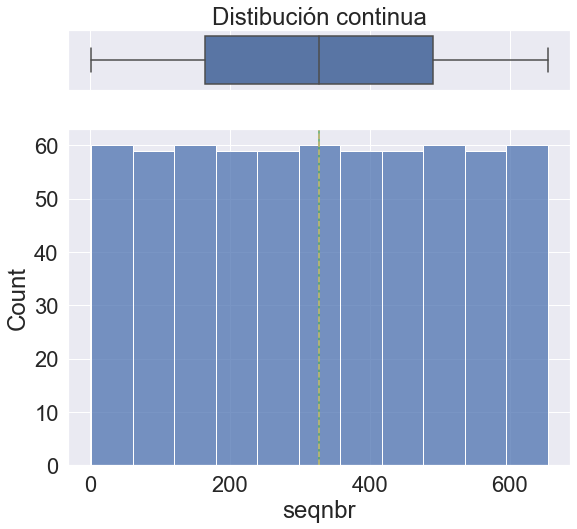

Cont


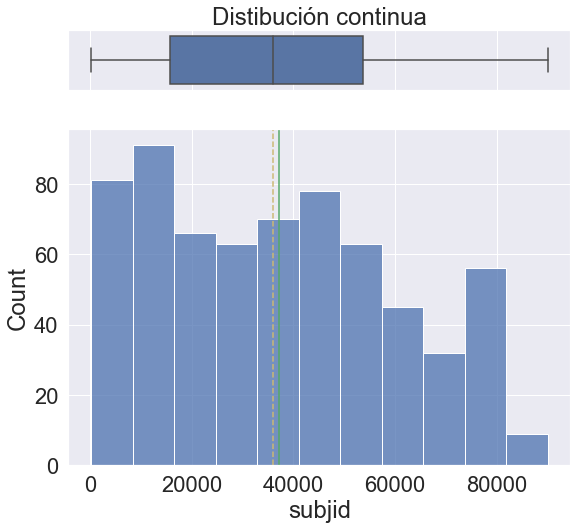

Cont


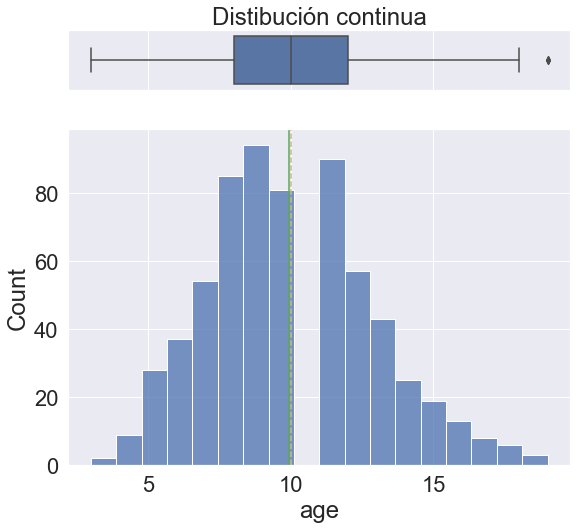

Cont


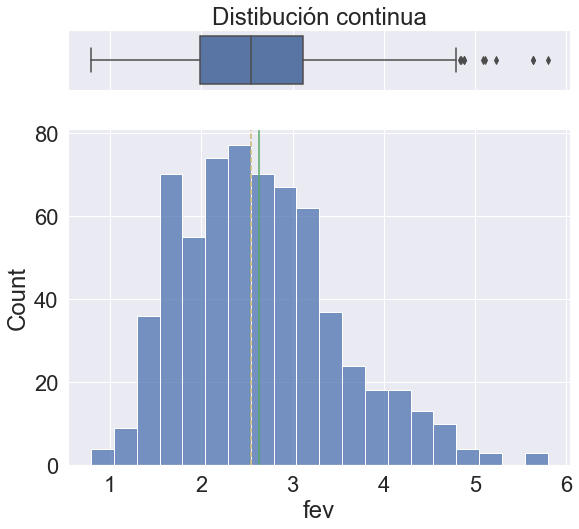

Cont


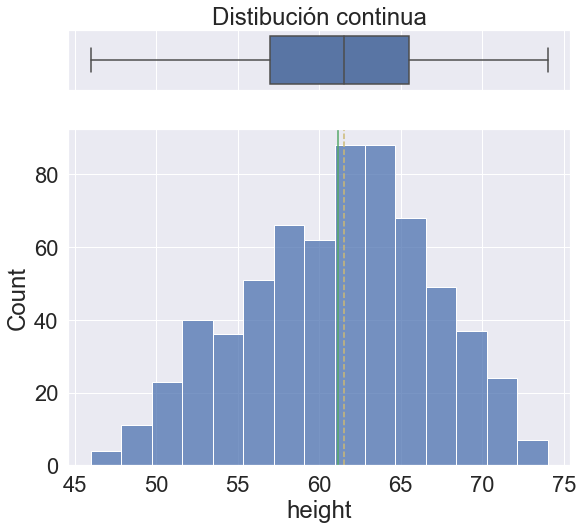

Cat


Cat


seqnbr    None
subjid    None
age       None
fev       None
height    None
sex       None
smoke     None
dtype: object

In [11]:
fevdata.apply(NuestrasFunciones_Def.plot)

In [12]:
varObjCont = fevdata.fev

imput = fevdata.drop(['fev'],axis=1)

In [13]:
imput.head()

,seqnbr,subjid,age,height,sex,smoke
0,1,301,9,57.0,2,2
1,2,451,8,67.5,2,2
2,3,501,7,54.5,2,2
3,4,642,9,53.0,1,2
4,5,901,9,57.0,1,2


In [14]:
#Valores Atipicos

In [15]:
fevdata.select_dtypes(include=np.number).apply(lambda x: x.skew())

seqnbr    0.000000
subjid    0.263379
age       0.413557
fev       0.662575
height   -0.213541
dtype: float64

In [16]:
#Trabajamos los outliers
imput.select_dtypes(include=np.number).copy().apply(lambda x: NuestrasFunciones_Def.gestiona_outliers(x))

seqnbr
subjid
age
height


,seqnbr,subjid,age,height
0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0


In [17]:
#Con esto se confirma que no hay Outliers
#No hay missing en las variables, lo cuales es muy bueno

In [18]:
# Agregar variables objetivo al input ya limpio
fevdata_Dep = pd.concat([imput, varObjCont], axis=1)
fevdata_Dep.head()

,seqnbr,subjid,age,height,sex,smoke,fev
0,1,301,9,57.0,2,2,1.708
1,2,451,8,67.5,2,2,1.724
2,3,501,7,54.5,2,2,1.720
3,4,642,9,53.0,1,2,1.558
4,5,901,9,57.0,1,2,1.895


In [ ]:
#Guardamos los datos en un csv

In [21]:
fevdata_Dep.to_csv("C:\\Users\\realf\\OneDrive\\Documents\\CLASES MASTER\\Mineria de Datos\\Tarea Guille Mineria de datos\\fevdata_Dep.csv")

#Nuevos datos

In [19]:
#Leer Datos depurados
fevDep = pd.read_csv("C:\\Users\\realf\\OneDrive\\Documents\\CLASES MASTER\\Mineria de Datos\\Tarea Guille Mineria de datos\\fevdata_Dep.csv", index_col=0)

#Descriptivo de Comparacion 
fevDep.head()

,seqnbr,subjid,age,height,sex,smoke,fev
0,1,301,9,57.0,2,2,1.708
1,2,451,8,67.5,2,2,1.724
2,3,501,7,54.5,2,2,1.720
3,4,642,9,53.0,1,2,1.558
4,5,901,9,57.0,1,2,1.895


In [20]:
fevDep.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 654 entries, 0 to 653
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   seqnbr  654 non-null    int64  
 1   subjid  654 non-null    int64  
 2   age     654 non-null    int64  
 3   height  654 non-null    float64
 4   sex     654 non-null    int64  
 5   smoke   654 non-null    int64  
 6   fev     654 non-null    float64
dtypes: float64(2), int64(5)
memory usage: 40.9 KB


In [21]:
#Descripcion de los Dtos
fevDep.describe(include='all')

,seqnbr,subjid,age,height,sex,smoke,fev
count,654.00000,654.000000,654.000000,654.000000,654.000000,654.000000,654.000000
mean,327.50000,37169.571865,9.931193,61.143578,1.486239,1.900612,2.636780
std,188.93782,23690.860350,2.953935,5.703513,0.500193,0.299412,0.867059
min,1.00000,201.000000,3.000000,46.000000,1.000000,1.000000,0.791000
25%,164.25000,15811.000000,8.000000,57.000000,1.000000,2.000000,1.981000
50%,327.50000,36071.000000,10.000000,61.500000,1.000000,2.000000,2.547500
75%,490.75000,53638.500000,12.000000,65.500000,2.000000,2.000000,3.118500
max,654.00000,90001.000000,19.000000,74.000000,2.000000,2.000000,5.793000


In [22]:
#Lista de columnas con menos de 10 valores  distintos , Potenciales Factores!
to_factor = list(fevDep.loc[:,fevDep.nunique()<10]);

#Cambio de tipo de ellas Factor 
fevDep[to_factor] = fevDep[to_factor].astype('category')


In [23]:
fevDep.info() #Podemos ver que se realizo el cambio de tipo de variable de continua a categorica 

<class 'pandas.core.frame.DataFrame'>
Int64Index: 654 entries, 0 to 653
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype   
---  ------  --------------  -----   
 0   seqnbr  654 non-null    int64   
 1   subjid  654 non-null    int64   
 2   age     654 non-null    int64   
 3   height  654 non-null    float64 
 4   sex     654 non-null    category
 5   smoke   654 non-null    category
 6   fev     654 non-null    float64 
dtypes: category(2), float64(2), int64(3)
memory usage: 32.2 KB


In [24]:
#Estudio Descriptivo de relaciones con la respuesta #(Modelo de regresión lineal sin interacciones entre las variables)

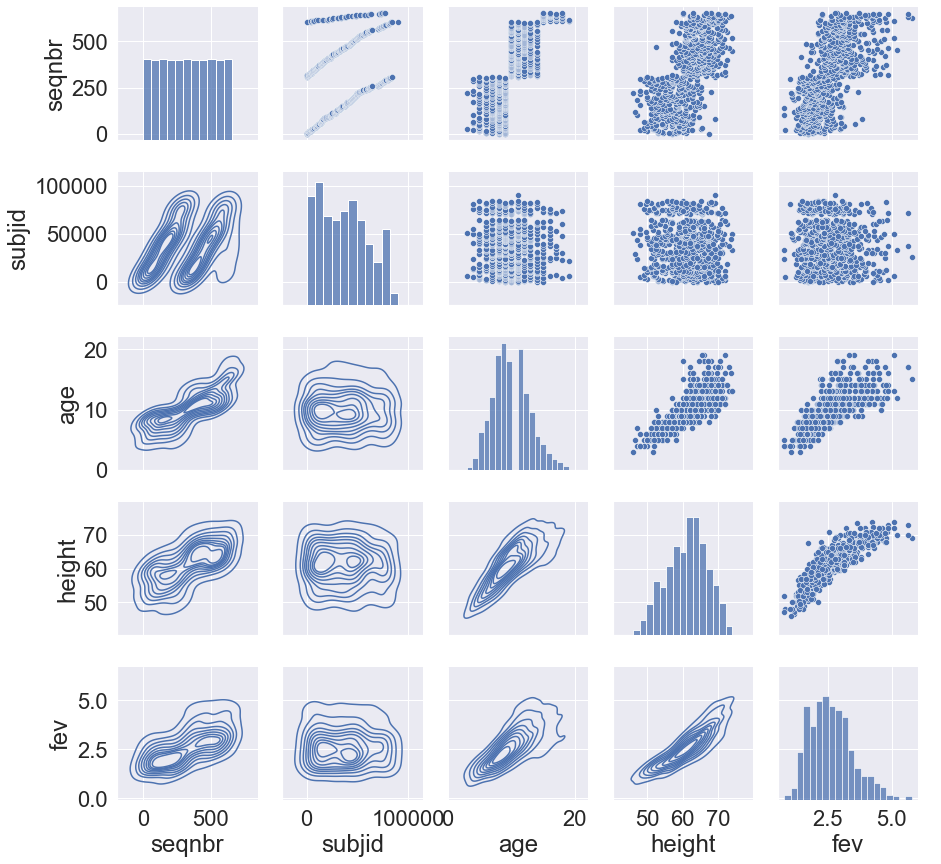

In [25]:
import seaborn as sns

g = sns.PairGrid(fevDep.iloc[:,:])
g.map_diag(sns.histplot)
g.map_lower(sns.kdeplot)
g.map_upper(sns.scatterplot)
g.add_legend()


In [26]:
# En estos graficos vemos que existe una fuerte relacion entre, nuestra variable objetivo fev con height,
# ademas de una relacion entre: age y fev, seqnbr y feb, ademas de age y height.
# Poca relacion por ejemplo entre subjid con height  y age. 
#Con esto nos damos cuenta de que si hay relacion entre algunas variables.

In [27]:
corr = fevDep.corr()
corr.style.background_gradient(cmap='coolwarm').format(precision=3)

,seqnbr,subjid,age,height,fev
seqnbr,1.000,0.406,0.783,0.632,0.616
subjid,0.406,1.000,-0.011,-0.032,-0.015
age,0.783,-0.011,1.000,0.792,0.756
height,0.632,-0.032,0.792,1.000,0.868
fev,0.616,-0.015,0.756,0.868,1.000


In [28]:
#Variables de control
fevDep['aleatorio'] = np.random.uniform(0,1,size=fevDep.shape[0])
fevDep['aleatorio2'] = np.random.uniform(0,1,size=fevDep.shape[0])
fevDep.head()

,seqnbr,subjid,age,height,sex,smoke,fev,aleatorio,aleatorio2
0,1,301,9,57.0,2,2,1.708,0.379384,0.681703
1,2,451,8,67.5,2,2,1.724,0.181823,0.401525
2,3,501,7,54.5,2,2,1.720,0.635702,0.092297
3,4,642,9,53.0,1,2,1.558,0.776366,0.489479
4,5,901,9,57.0,1,2,1.895,0.729161,0.186336


In [29]:
import pandas_profiling

pandas_profiling.ProfileReport(fevDep)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [30]:
#Los resultados nos muestran que seqnbr está altamente correlacionado con age, height, smoke, fev
# Ege está altamente correlacionada con seqnbr y height, smoke, fev.
#El grafico de correlacion se encuntra un tanto lleno de color, lo cual significa las variables tinen bastante correlacionn con la respuesta

#Ademas Según la observación, tanto seqnbr como subjid son códigos de identificación de muestras, y son variables que no tienen relación con la variable objetivo.
#Los descartaremos en el modelado.

In [31]:
# Eliminar variable objetivo continua 
varObjCont = fevDep.fev
imputfev = fevDep.drop(['fev','subjid'],axis=1)
varObjCont.info()
imputfev.head()


<class 'pandas.core.series.Series'>
Int64Index: 654 entries, 0 to 653
Series name: fev
Non-Null Count  Dtype  
--------------  -----  
654 non-null    float64
dtypes: float64(1)
memory usage: 26.4 KB


,seqnbr,age,height,sex,smoke,aleatorio,aleatorio2
0,1,9,57.0,2,2,0.379384,0.681703
1,2,8,67.5,2,2,0.181823,0.401525
2,3,7,54.5,2,2,0.635702,0.092297
3,4,9,53.0,1,2,0.776366,0.489479
4,5,9,57.0,1,2,0.729161,0.186336


In [32]:
# Aplicar la función al input completo contra la objetivo

tablaCramer = pd.DataFrame(imputfev.apply(lambda x: NuestrasFunciones_Def.cramers_v(x,varObjCont)),columns=['VCramer'])
tablaCramer

# Obtener el gráfico de importancia de las variables frente a la objetivo continua según vcramer
import plotly.express as px
px.bar(tablaCramer,x=tablaCramer.VCramer,title='Relaciones frente Fev').update_yaxes(categoryorder="total ascending")

In [33]:
#En este grafico podemos observar el VCramer maximo height de 0.5390 , lo cual nos muestra un nivelde asociacion importante.
# Despues esta age con 0.4373 con bastante asociacion.
# Y despues con un nivel parecido esta el sex 0.3157 y seqnbr 0.3095, que tienen un cierto nivel de asociacion


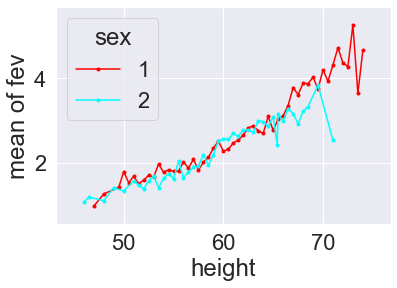

In [34]:
from statsmodels.graphics.factorplots import interaction_plot
import matplotlib.pyplot as plt


# Gráfico de interacción de las componentes del ANOVA
fig = interaction_plot(x=fevDep.height.astype('object'), trace=fevDep['sex'].astype('object'), response=fevDep['fev'])

In [35]:
# Matriz de correlaciones 
corr = fevDep.corr()
corr.style.background_gradient(cmap='coolwarm').format(precision=3)
#sns.heatmap(corr, annot=True)

,seqnbr,subjid,age,height,fev,aleatorio,aleatorio2
seqnbr,1.000,0.406,0.783,0.632,0.616,-0.058,0.044
subjid,0.406,1.000,-0.011,-0.032,-0.015,-0.015,0.050
age,0.783,-0.011,1.000,0.792,0.756,-0.063,-0.007
height,0.632,-0.032,0.792,1.000,0.868,-0.043,0.016
fev,0.616,-0.015,0.756,0.868,1.000,-0.044,-0.007
aleatorio,-0.058,-0.015,-0.063,-0.043,-0.044,1.000,0.078
aleatorio2,0.044,0.050,-0.007,0.016,-0.007,0.078,1.000


##Ajusta el mejor modelo de regresión lineal.

In [41]:
from sklearn import linear_model
# Generar conjunto de test y train.
X_train, X_test, y_train, y_test = train_test_split(imputfev, varObjCont, test_size=0.2, random_state=30)

print('Training dataset shape:', X_train.shape, y_train.shape)
print('Testing dataset shape:', X_test.shape, y_test.shape)

Training dataset shape: (523, 7) (523,)
Testing dataset shape: (131, 7) (131,)


In [42]:
# Creamos el objeto de Regresión Linear
regr = linear_model.LinearRegression()

In [43]:
# Entrenamos nuestro modelo
regr.fit(X_train, y_train)

# Hacemos las predicciones que en definitiva una línea (en este caso, al ser 2D)
y_pred = regr.predict(X_train)

In [46]:
# Veamos los coeficienetes obtenidos, En nuestro caso, serán la Tangente
print('Coefficients: \n', regr.coef_)
# Este es el valor donde corta el eje Y (en X=0)
print('Independent term: \n', regr.intercept_)
# Error Cuadrado Medio
print("Mean squared error: %.2f" % mean_squared_error(y_train, y_pred))
# Puntaje de Varianza. El mejor puntaje es un 1.0
print('Variance score: %.2f' % r2_score(y_train, y_pred))

Coefficients: 
 [ 1.58764811e-04  5.48500399e-02  1.04879873e-01 -1.70418109e-01
  7.06725279e-02  5.99142193e-03 -3.87812807e-02]
Independent term: 
 -4.230941633616135
Mean squared error: 0.17
Variance score: 0.78
